<div style="display: flex; background-color: RGB(65, 105, 225);" >
<h1 style="margin: auto; padding: 30px; "> ANALYSE DES VENTES D'UNE LIBRAIRIE 📚</h1>
</div>

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 1 - Préparation de l'environnement et chargement des fichiers</h2>
</div>

<div style="border: 3px solid RGB(51,165,182);border-radius: 8px" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">1.1 - Importation des librairies 📒</h3>
</div>

In [ ]:
#Importation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker
from matplotlib.ticker import FuncFormatter
import seaborn as sb
import plotly.express as px


In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

<div style="border: 3px solid RGB(51,165,182);border-radius: 8px" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">1.2 - Importation des fichiers 📔</h3>
</div>

In [ ]:
#Importation du fichier customers.csv
df_customers = pd.read_csv("C:/Users/chris/Documents/GitHub/OC/P9/data_raw/customers.csv", sep=';')
#Importation du fichier products.csv
df_products = pd.read_csv("C:/Users/chris/Documents/GitHub/OC/P9/data_raw/products.csv", sep=';')
#Importation du fichier transactions.csv
df_transactions = pd.read_csv("C:/Users/chris/Documents/GitHub/OC/P9/data_raw/transactions.csv",
    sep=";",
    dtype=str,
    encoding="utf-8",
    low_memory=False
)


<div style="border: 3px solid RGB(51,165,182);border-radius: 8px" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">1.2 - Charte graphique 🎨</h3>
</div>

In [ ]:
# Palette (ton thème)
couleurs_theme = [
    "#496374", "#8F725F", "#389EE7", "#435A6B", "#A88E7B", "#6B5543"]
couleurs_theme2 = [ "#95A87B", "#7B436B", "#7B6B43", "#436B7B", "#6B4355","#A87B95"]

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 2 - Analyse exploratoire des fichiers</h2>
</div>

<div style="border: 3px solid RGB(51,165,182);border-radius: 8px" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">1️⃣ Exploration du fichier client</h3>
</div>

In [ ]:
#Observations du dataset
print("Le tableau comporte {} observations".format(df_customers.shape[0]))
print("Le tableau comporte {} colonnes".format(df_customers.shape[1]))

#La nature des données dans chacune des colonnes
print("La nature des colonnes est de type: {}".format(df_customers.dtypes))
#Le nombre de valeurs présentes dans chacune des colonnes
print("Voici le nombre de valeurs présentent dans chaque colonnes:{}".format(df_customers.count()))

Le tableau comporte 8621 observations
Le tableau comporte 3 colonnes
La nature des colonnes est de type: client_id    object
sex          object
birth         int64
dtype: object
Voici le nombre de valeurs présentent dans chaque colonnes:client_id    8621
sex          8621
birth        8621
dtype: int64


In [ ]:
df_customers.describe()

,birth
count,8621.000000
mean,1978.275606
std,16.917958
min,1929.000000
25%,1966.000000
50%,1979.000000
75%,1992.000000
max,2004.000000


In [ ]:
#Valeurs des catégories sexe
print(df_customers['sex'].unique())

['f' 'm']


In [ ]:
df_doublons = df_customers[df_customers.duplicated(keep=False)].copy()

In [ ]:
df_customers.head()

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


<div style="border: 3px solid RGB(51,165,182);border-radius: 8px" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">2️⃣ Exploration du fichier produit</h3>
</div>

In [ ]:
#Observations du dataset
print("Le tableau comporte {} observations".format(df_products.shape[0]))
print("Le tableau comporte {} colonnes".format(df_products.shape[1]))

#La nature des données dans chacune des colonnes
print("La nature des colonnes est de type: {}".format(df_products.dtypes))
#Le nombre de valeurs présentes dans chacune des colonnes
print("Voici le nombre de valeurs présentent dans chaque colonnes:{}".format(df_products.count()))

Le tableau comporte 3286 observations
Le tableau comporte 3 colonnes
La nature des colonnes est de type: id_prod     object
price      float64
categ        int64
dtype: object
Voici le nombre de valeurs présentent dans chaque colonnes:id_prod    3286
price      3286
categ      3286
dtype: int64


In [ ]:
df_products.head()

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


In [ ]:
df_products.describe()

,price,categ
count,3286.000000,3286.000000
mean,21.863597,0.370359
std,29.849786,0.615446
min,0.620000,0.000000
25%,6.990000,0.000000
50%,13.075000,0.000000
75%,22.990000,1.000000
max,300.000000,2.000000


In [ ]:
df_doublons = df_products[df_products.duplicated(keep=False)].copy()


<div style="border: 3px solid RGB(51,165,182);border-radius: 8px" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">3️⃣ Exploration du fichier transaction</h3>
</div>

In [ ]:
#Observations du dataset
print("Le tableau comporte {} observations".format(df_transactions.shape[0]))
print("Le tableau comporte {} colonnes".format(df_transactions.shape[1]))

#La nature des données dans chacune des colonnes
print("La nature des colonnes est de type: {}".format(df_transactions.dtypes))
#Le nombre de valeurs présentes dans chacune des colonnes
print("Voici le nombre de valeurs présentent dans chaque colonnes:{}".format(df_transactions.count()))

Le tableau comporte 1048575 observations
Le tableau comporte 4 colonnes
La nature des colonnes est de type: id_prod       object
date          object
session_id    object
client_id     object
dtype: object
Voici le nombre de valeurs présentent dans chaque colonnes:id_prod       687534
date          687534
session_id    687534
client_id     687534
dtype: int64


In [ ]:
df_transactions.describe()

,id_prod,date,session_id,client_id
count,687534,687534,687534,687534
unique,3265,687419,345505,8600
top,1_369,2021-10-13 17:05:59.572162,s_118668,c_1609
freq,2340,2,14,25586


In [ ]:
df_transactions = df_transactions.dropna(how="all")
print("Le tableau comporte {} observations".format(df_transactions.shape[0]))
print("Le tableau comporte {} colonnes".format(df_transactions.shape[1]))
df_transactions.head()

Le tableau comporte 687534 observations
Le tableau comporte 4 colonnes


,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [ ]:
df_doublons = df_transactions[df_transactions.duplicated(keep=False)].copy()

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 3 - Jointure des fichiers</h2>
</div>

In [ ]:
df_merged = pd.merge(df_transactions, df_customers, on='client_id', how='left')
df_merged = pd.merge(df_merged, df_products, on='id_prod', how='left')

#Observations du dataset
print("Le tableau comporte {} observations".format(df_merged.shape[0]))
print("Le tableau comporte {} colonnes".format(df_merged.shape[1]))

#La nature des données dans chacune des colonnes
print("La nature des colonnes est de type: {}".format(df_merged.dtypes))
#Le nombre de valeurs présentes dans chacune des colonnes
print("Voici le nombre de valeurs présentent dans chaque colonnes:{}".format(df_merged.count()))


Le tableau comporte 687534 observations
Le tableau comporte 8 colonnes
La nature des colonnes est de type: id_prod        object
date           object
session_id     object
client_id      object
sex            object
birth           int64
price         float64
categ           int64
dtype: object
Voici le nombre de valeurs présentent dans chaque colonnes:id_prod       687534
date          687534
session_id    687534
client_id     687534
sex           687534
birth         687534
price         687534
categ         687534
dtype: int64


In [ ]:
# 1. On convertit d'abord la colonne 'date' en objet datetime de Pandas (une seule fois)
df_merged['date'] = pd.to_datetime(df_merged['date'])

# 2. On extrait les différentes informations avec l'accesseur .dt
df_merged['Jour'] = df_merged['date'].dt.day_name(locale='fr_FR.UTF-8')
df_merged['Mois'] = df_merged['date'].dt.month_name(locale='fr_FR.UTF-8')
df_merged['Année'] = df_merged['date'].dt.year
df_merged['semaine'] = df_merged['date'].dt.isocalendar().week
df_merged['Mois_num'] = df_merged['date'].dt.month
df_merged['date_2'] = df_merged['date'].dt.strftime('%Y-%m-%d')

df_merged.head()

,id_prod,date,session_id,client_id,sex,birth,price,categ,Jour,Mois,Année,semaine,Mois_num,date_2
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,f,1967,11.99,0,Lundi,Mars,2021,9,3,2021-03-01
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,m,1960,19.37,0,Lundi,Mars,2021,9,3,2021-03-01
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,m,1988,4.50,0,Lundi,Mars,2021,9,3,2021-03-01
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912,f,1989,6.55,0,Lundi,Mars,2021,9,3,2021-03-01
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033,f,1956,16.49,0,Lundi,Mars,2021,9,3,2021-03-01


In [ ]:
df_doublons = df_merged[df_merged.duplicated(keep=False)].copy()

In [ ]:
df_merged.describe()


,date,birth,price,categ,Année,semaine,Mois_num
count,687534,687534.000000,687534.000000,687534.000000,687534.000000,687534.0,687534.000000
mean,2022-03-01 21:24:00.618519296,1977.817391,17.493918,0.448789,2021.662289,26.553562,6.547208
min,2021-03-01 00:01:07.843138,1929.000000,0.620000,0.000000,2021.000000,1.0,1.000000
25%,2021-09-10 10:35:20.642323456,1970.000000,8.990000,0.000000,2021.000000,13.0,4.000000
50%,2022-02-27 06:50:25.400120064,1980.000000,13.990000,0.000000,2022.000000,26.0,7.000000
75%,2022-08-28 22:16:49.841665536,1987.000000,19.080000,1.000000,2022.000000,40.0,10.000000
max,2023-02-28 23:58:30.792755,2004.000000,300.000000,2.000000,2023.000000,52.0,12.000000
std,NaN,13.607935,18.238337,0.594563,0.618184,15.154791,3.480693


In [ ]:
df_merged['categ'].value_counts()

categ
0    415459
1    235592
2     36483
Name: count, dtype: int64

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 4 - Analyses univariées 📊</h2>
</div>

<div style="border: 3px solid RGB(51,165,182);border-radius: 8px; background-color: RGB(0,0,0)" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">1️⃣ Informations générales</h3>
</div>

In [ ]:
print('Le nombre total de référence produit en catalogue est de 3286')
nb_categ=df_merged['categ'].nunique()
print(f"Il y a {nb_categ} catégories de produits différentes dans le catalogue.")

df2021= df_merged[(df_merged['date'] >= '2021-03-01') & (df_merged['date'] < '2022-03-01')].copy()

df2022= df_merged[(df_merged['date'] >= '2022-03-01') & (df_merged['date'] < '2023-03-01')].copy()
nb_produits2021=df2021['id_prod'].nunique()
print(f"Il y a {nb_produits2021} produits différents vendus entre mars 2021 et février 2022.")
nb_produits2022=df2022['id_prod'].nunique()
print(f"Il y a {nb_produits2022} produits différents vendus entre mars 2022 et février 2023.") 

Le nombre total de référence produit en catalogue est de 3286
Il y a 3 catégories de produits différentes dans le catalogue.
Il y a 3265 produits différents vendus entre mars 2021 et février 2022.
Il y a 3220 produits différents vendus entre mars 2022 et février 2023.


<div style="border: 3px solid RGB(51,165,182);border-radius: 8px; background-color: RGB(0,0,0)" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">2️⃣ Analyse du chiffre d'affaire</h3>
</div>

In [ ]:
df_merged['Année'] = df_merged['Année'].astype(str)

<div style="border: 2px solid RGB(51,165,182); border-radius: 8px; padding: 15px; background-color: RGB(51,165,182);">
  <h3 style="margin: 0; color: #ffffff;"> Moyenne mobile</h3>
</div>
Une moyenne mobile est une technique statistique utilisée pour analyser des séries chronologiques (données ordonnées dans le temps). Son objectif principal est de lisser les fluctuations à court terme et de mettre en évidence les tendances à long terme ou les cycles.

In [ ]:
# Moyenne mobile 7 jours (basée sur le CA journalier)

df_ma7 = (
    df_merged
    .assign(date=pd.to_datetime(df_merged["date"]))
    .set_index("date")
    .sort_index()
    .resample("D")["price"].sum()                    # CA par jour (remplace .sum() si tu veux autre chose)
    .rolling(window=7, min_periods=1).mean()         # moyenne mobile 7 jours
    .rename("ca_ma7")
    .reset_index()
)

df_ma7.head()


,date,ca_ma7
0,2021-03-01,16565.2200
1,2021-03-02,16025.8350
2,2021-03-03,15750.1200
3,2021-03-04,15611.6075
4,2021-03-05,15983.5600


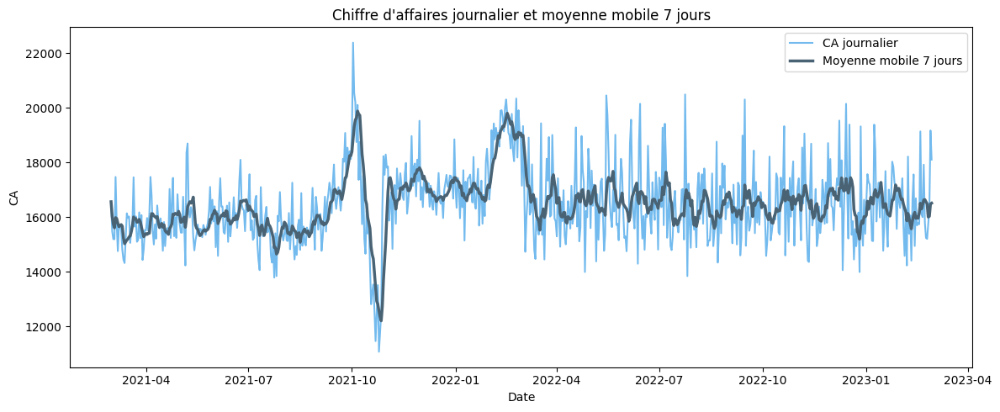

In [ ]:


# Série journalière + moyenne mobile 7 jours
serie_jour = (
    df_merged
    .assign(date=pd.to_datetime(df_merged["date"]))
    .set_index("date")
    .sort_index()
    .resample("D")["price"].sum()
)

ma7 = serie_jour.rolling(window=7, min_periods=1).mean()

# Graphique
plt.figure(figsize=(12, 5))
plt.plot(serie_jour.index, serie_jour.values, label="CA journalier", color=couleurs_theme[2], linewidth=1.5, alpha=0.7)
plt.plot(ma7.index, ma7.values, label="Moyenne mobile 7 jours", color=couleurs_theme[0], linewidth=2.5)

plt.title("Chiffre d'affaires journalier et moyenne mobile 7 jours")
plt.xlabel("Date")
plt.ylabel("CA")
plt.legend()
plt.tight_layout()
plt.show()

On observe une chute du CA d'environ 4k euros sur la fin de la prériode de novembre   2021.

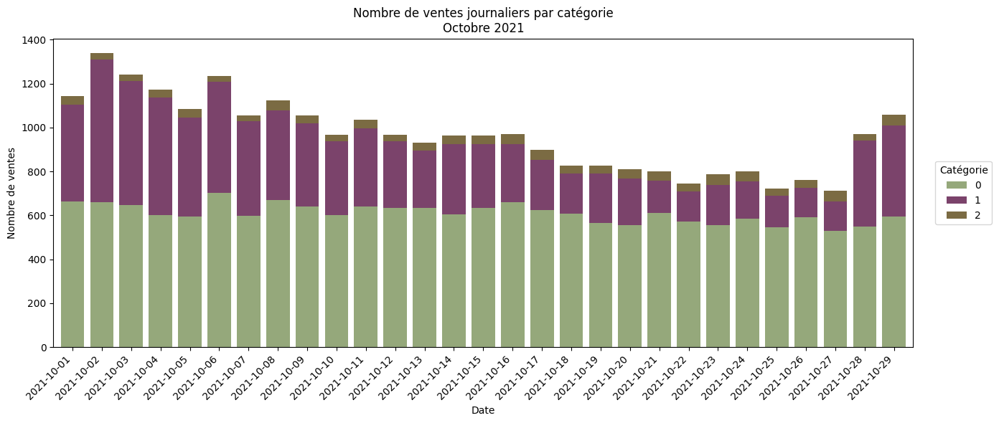

In [ ]:
# Filtrer la période : 01/10/2021 -> 31/12/2021
df_filtre = df_merged.copy()
df_filtre["date"] = pd.to_datetime(df_filtre["date"])

df_filtre = df_filtre[
    (df_filtre["date"] >= "2021-10-01") &
    (df_filtre["date"] < "2021-10-30")
]

# Calcul du nombre de ventes journalier par catégorie
ventes_par_date_categ = (
    df_filtre
    .groupby([df_filtre["date"].dt.date, "categ"])
    .size()
    .reset_index(name="nb_ventes")
)

# Pivot pour obtenir un DataFrame avec dates en index et catégories en colonnes
pivot_ventes = ventes_par_date_categ.pivot(index="date", columns="categ", values="nb_ventes").fillna(0)

# Graphique : histogramme empilé des catégories par nombre de ventes journalier
plt.figure(figsize=(14, 6))
pivot_ventes.plot(kind="bar", stacked=True, ax=plt.gca(), 
                  color=couleurs_theme2[:len(pivot_ventes.columns)],
                  width=0.8)

plt.title("Nombre de ventes journaliers par catégorie\nOctobre 2021")
plt.xlabel("Date")
plt.ylabel("Nombre de ventes")
plt.legend(title="Catégorie", loc="center left", bbox_to_anchor=(1.02, 0.5))
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

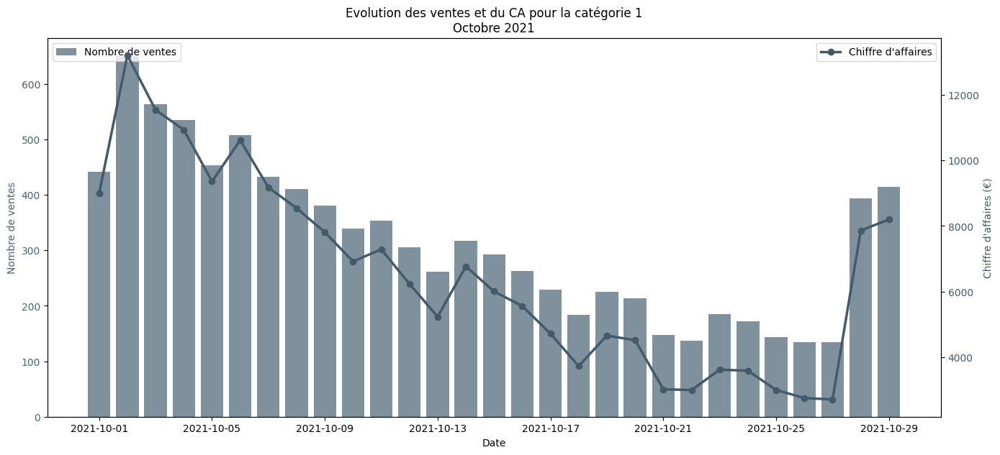

In [ ]:
# Evolution des ventes pour categ==1
df_categ_1 = df_filtre[df_filtre['categ'] == 1].copy()

# Nombre de ventes journalier par catégorie 1
ventes_categ_1 = (
    df_categ_1
    .groupby(df_categ_1["date"].dt.date)
    .size()
    .reset_index(name="nb_ventes")
)
ventes_categ_1.columns = ["date", "nb_ventes"]

# CA journalier pour catégorie 1
ca_categ_1 = (
    df_categ_1
    .groupby(df_categ_1["date"].dt.date)["price"]
    .sum()
    .reset_index(name="ca")
)
ca_categ_1.columns = ["date", "ca"]

# Fusion des deux DataFrames
data_combined = ventes_categ_1.merge(ca_categ_1, on="date")

# Graphique avec deux axes Y
fig, ax1 = plt.subplots(figsize=(14, 6))

# Histogramme des ventes sur l'axe gauche
color = couleurs_theme[0]
ax1.set_xlabel('Date')
ax1.set_ylabel('Nombre de ventes', color=color)
bars = ax1.bar(data_combined["date"], data_combined["nb_ventes"], color=color, alpha=0.7, label='Nombre de ventes')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')

# Courbe du CA sur l'axe droit
ax2 = ax1.twinx()
color = couleurs_theme[3]
ax2.set_ylabel('Chiffre d\'affaires (€)', color=color)
line = ax2.plot(data_combined["date"], data_combined["ca"], color=color, linewidth=2.5, marker='o', label='Chiffre d\'affaires')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

plt.xticks(rotation=45, ha="right")
fig.tight_layout()
plt.title("Evolution des ventes et du CA pour la catégorie 1\nOctobre 2021")
plt.show()

In [ ]:
# Evolution du chiffre d'affaires annuel

print(f"Différence de CA entre les deux périodes : {df2022['price'].sum() - df2021['price'].sum():.2f} €")
print(f"Pourcentage de CA : {((df2022['price'].sum() - df2021['price'].sum()) / df2021['price'].sum()) * 100:.2f} %")


Différence de CA entre les deux périodes : 16320.16 €
Pourcentage de CA : 0.27 %


In [ ]:
#Graphique du CA annuel
#Visualisation avec plotly

ca_2021 = df2021.groupby("categ")["price"].sum().reset_index(name="ca")
ca_2021["Année"] = "2021"

ca_2022 = df2022.groupby("categ")["price"].sum().reset_index(name="ca")
ca_2022["Année"] = "2022"

# Fusion des deux périodes dans un seul DataFrame
df_ca = pd.concat([ca_2021, ca_2022])
df_ca["categ"] = df_ca["categ"].astype(str)

In [ ]:
#Graphique du CA annuel empilé par catégorie avec pourcentages
df_ca['percentage'] = df_ca.groupby('Année')['ca'].transform(lambda x: x / x.sum()) * 100

fig = px.bar(
    df_ca,
    x="Année",
    y="ca",
    color="categ",
    barmode="stack",
    title="Chiffre d'affaires par année — empilé par catégorie avec pourcentages",
    labels={
        "Année": "Année",
        "ca": "Chiffre d'affaires (€)",
        "categ": "Catégorie"
    },
    color_discrete_sequence=couleurs_theme2,
    text=df_ca['percentage'].apply(lambda x: f'{x:.1f}%') # Add percentages as text
)

fig.update_traces(textposition='inside', insidetextfont=dict(color='white'))
fig.show()

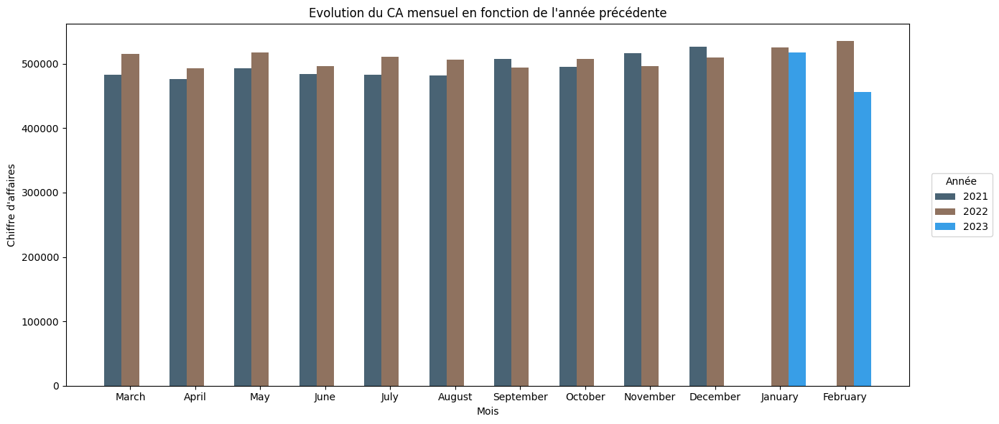

In [ ]:

# Evolution du CA mensuel

df_tmp = df_merged.copy()
df_tmp["date"] = pd.to_datetime(df_tmp["date"])

monthly = (
    df_tmp
    .assign(annee=df_tmp["date"].dt.year, mois=df_tmp["date"].dt.month)
    .groupby(["mois", "annee"], as_index=False)["price"].sum()
    .rename(columns={"price": "ca"})
)

pivot = monthly.pivot(index="mois", columns="annee", values="ca")

# --- Réordonnancement: Mars..Décembre puis Janvier..Février
order = [3,4,5,6,7,8,9,10,11,12,1,2]
pivot = pivot.reindex(order)

# --- Graphique barres groupées
years = list(pivot.columns)
x = list(range(len(pivot.index)))
bar_w = 0.8 / max(len(years), 1)

plt.figure(figsize=(14, 6))

for i, y in enumerate(years):
    offsets = [(xi - 0.4 + bar_w/2) + i*bar_w for xi in x]
    plt.bar(
        offsets,
        pivot[y].values,
        width=bar_w,
        label=str(y),
        color=couleurs_theme[i % len(couleurs_theme)]
    )

plt.xticks(x, pivot.index.map(lambda m: pd.to_datetime(m, format="%m").strftime("%B")))
plt.title("Evolution du CA mensuel en fonction de l'année précédente")
plt.xlabel("Mois")
plt.ylabel("Chiffre d'affaires")
plt.legend(title="Année", ncols=min(len(years), 4))
plt.legend(title="Année", loc="center left", bbox_to_anchor=(1.02, 0.5))
plt.tight_layout()
plt.show()


Le diagremme de pareto permet d'évaluer le nombre de produits réalisant 80% du CA.

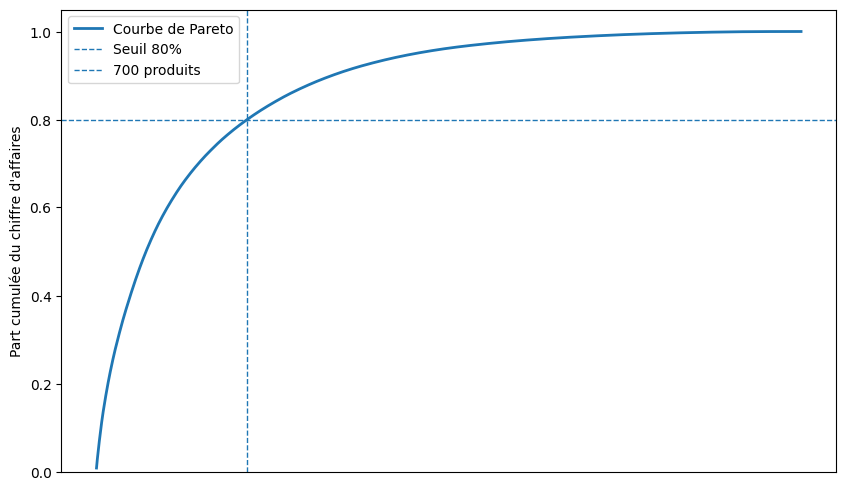

700 produits sur 3286 permettent d’atteindre 80% du chiffre d’affaires.
Les distribution est très concentrée : une petite partie des produits génère la majorité du CA.


In [ ]:
# 1. CA par produit (total sur la période) et trié du plus grand au plus petit
ca_produits = (
    df_merged.groupby('id_prod')['price']
    .sum()
    .sort_values(ascending=False)
)

# 2. Cumul du CA par produit
ca_cumule = ca_produits.cumsum()

# 3. Part cumulée du CA converti le CA cumulé en pourcentage du CA total
part_cumulee = ca_cumule / ca_produits.sum()

# 4. Nombre cumulé de produits 
nb_produits = np.arange(1, len(ca_produits) + 1)

# 5. Nombre de produits nécessaires pour atteindre 80% du CA
seuil_80 = np.argmax(part_cumulee >= 0.8) + 1

# 6. Graphique de la courbe de Lorenz
plt.figure(figsize=(10, 6))
plt.plot(nb_produits, part_cumulee, linewidth=2, label='Courbe de Pareto')
plt.axhline(0.8, linestyle='--', linewidth=1, label='Seuil 80%')
plt.axvline(seuil_80, linestyle='--', linewidth=1, label=f'{seuil_80} produits')

plt.ylabel("Part cumulée du chiffre d'affaires")
plt.xticks([])  # enlève les labels en abscisse
plt.ylim(0, 1.05)
plt.legend()
plt.show()

print(f"{seuil_80} produits sur 3286 permettent d’atteindre 80% du chiffre d’affaires.")
print("Les distribution est très concentrée : une petite partie des produits génère la majorité du CA.")

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">4.2 - Analyse des ventes</h3>
</div>

In [ ]:
# Répartition des ventes (nb de lignes) par catégorie pour chaque période
ventes_categ_2021 = df2021.groupby("categ").size().sort_values(ascending=False).rename("ventes")
ventes_categ_2022 = df2022.groupby("categ").size().sort_values(ascending=False).rename("ventes")

# Tableau comparatif
repartition_ventes = (
    pd.concat([ventes_categ_2021, ventes_categ_2022], axis=1, keys=["2021 (Mar→Fév)", "2022 (Mar→Fév)"])
      .fillna(0)
      .astype(int)
)

# Ajout des % (par période)
repartition_pct = repartition_ventes.div(repartition_ventes.sum(axis=0), axis=1).mul(100).round(2)

display(repartition_ventes)
display(repartition_pct)


,2021 (Mar→Fév),2022 (Mar→Fév)
categ,,
0,209662,205797
1,118158,117434
2,17788,18695


,2021 (Mar→Fév),2022 (Mar→Fév)
categ,,
0,60.66,60.19
1,34.19,34.34
2,5.15,5.47


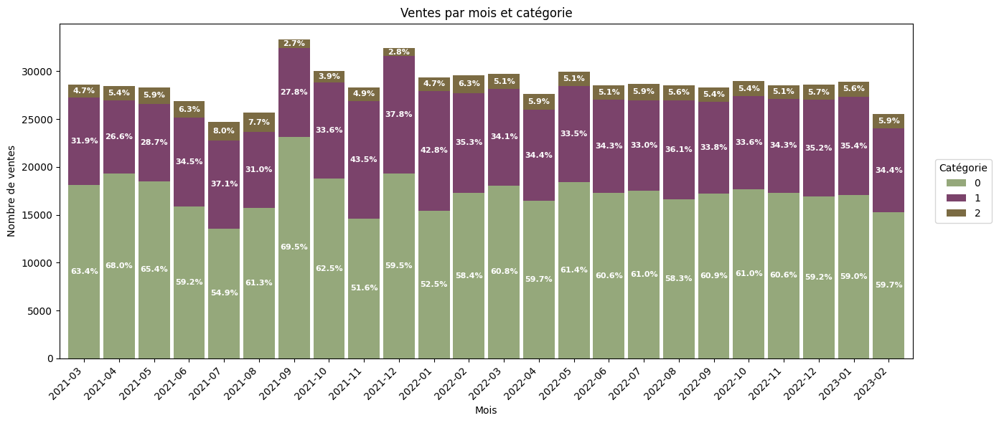

In [ ]:
def plot_ventes_mois_categ_empile(df, titre):

    pivot = (
        df.groupby(["Année", "Mois_num", "categ"])
          .size()
          .reset_index(name="ventes")
          .assign(mois=lambda x: x["Année"].astype(str) + "-" + x["Mois_num"].astype(int).astype(str).str.zfill(2))
          .pivot(index="mois", columns="categ", values="ventes")
          .fillna(0)
          .sort_index()
    )

    pivot_pct = pivot.div(pivot.sum(axis=1), axis=0) * 100

    # ── Couleurs par catégorie ────────────────────────────────────────────────
    couleurs = couleurs_theme2[:len(pivot.columns)]

    fig, ax = plt.subplots(figsize=(14, 6))
    pivot.plot(kind="bar", stacked=True, ax=ax, width=0.9,
               color=couleurs[:len(pivot.columns)])

    # ── Labels % dans chaque segment ─────────────────────────────────────────
    bottom_values = np.zeros(len(pivot.index))

    for cat_idx, category in enumerate(pivot.columns):
        for month_idx, bar in enumerate(ax.containers[cat_idx]):
            height = bar.get_height()
            if height > 0:
                pct = pivot_pct.iloc[month_idx, cat_idx]
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    bottom_values[month_idx] + height / 2,
                    f"{pct:.1f}%",
                    ha="center", va="center",
                    color="white", fontsize=8, fontweight="bold"
                )
            bottom_values[month_idx] += height

    ax.set_title(titre)
    ax.set_xlabel("Mois")
    ax.set_ylabel("Nombre de ventes")
    plt.xticks(rotation=45, ha="right")
    plt.legend(title="Catégorie", loc="center left", bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout()
plt.show()

plot_ventes_mois_categ_empile(df_merged, "Ventes par mois et catégorie")

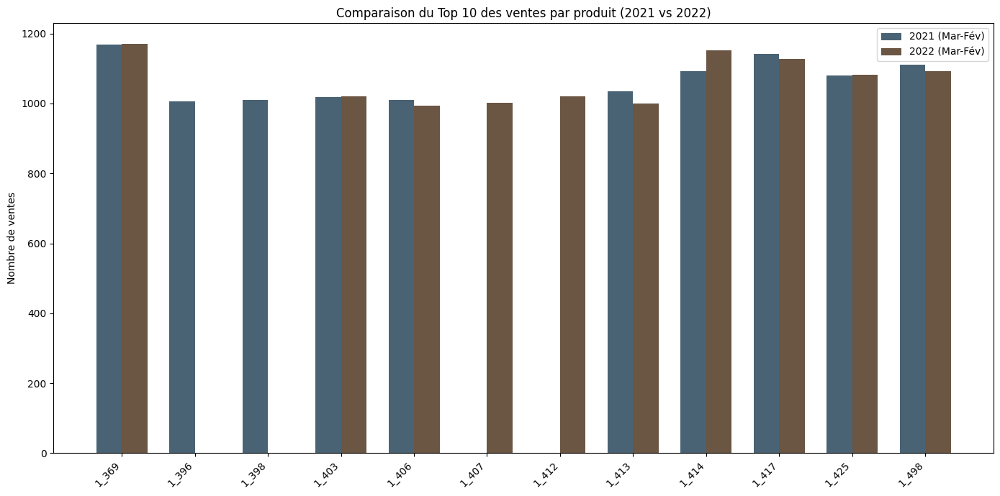

In [ ]:
#Comparaison des ventes de produits
# # 1. Calcul des top 10 pour chaque période
top10_2021 = df2021.groupby('id_prod').size().sort_values(ascending=False).head(10).reset_index(name='ventes_2021')
top10_2022 = df2022.groupby('id_prod').size().sort_values(ascending=False).head(10).reset_index(name='ventes_2022')

# 2. Fusion pour la comparaison
df_comp = pd.merge(top10_2021, top10_2022, on='id_prod', how='outer').fillna(0)

# 3. Préparation du graphique
labels = df_comp['id_prod']
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots(figsize=(14, 7))
rects1 = ax.bar(x - width/2, df_comp['ventes_2021'], width, label='2021 (Mar-Fév)', color=couleurs_theme[0])
rects2 = ax.bar(x + width/2, df_comp['ventes_2022'], width, label='2022 (Mar-Fév)', color=couleurs_theme[5])

ax.set_ylabel('Nombre de ventes')
ax.set_title('Comparaison du Top 10 des ventes par produit (2021 vs 2022)')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()

C:\Users\chris\AppData\Local\Temp\ipykernel_6876\3501371965.py:9: UserWarning:


The palette list has fewer values (6) than needed (20) and will cycle, which may produce an uninterpretable plot.



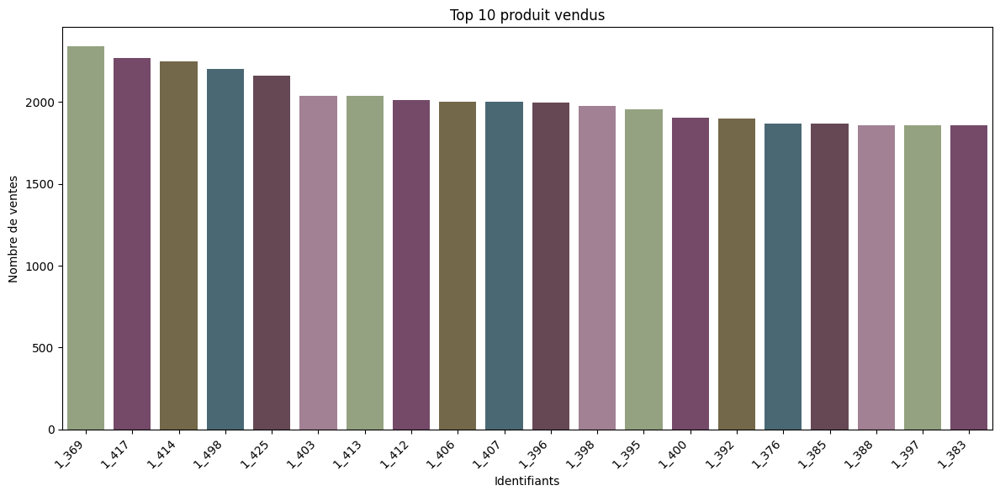

In [ ]:
top_ventes = df_merged['id_prod'].value_counts().head(20).reset_index()
top_ventes.columns = ['id_prod', 'nb_ventes']
top_ventes.head()

#Graphique

plt.figure(figsize=(12, 6))

sb.barplot(x='id_prod', y='nb_ventes', data=top_ventes, hue='id_prod', palette=couleurs_theme2, legend=False)
plt.title('Top 10 produit vendus')
plt.xlabel('Identifiants')
plt.ylabel('Nombre de ventes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

C:\Users\chris\AppData\Local\Temp\ipykernel_6876\1843323029.py:8: UserWarning:


The palette list has fewer values (6) than needed (20) and will cycle, which may produce an uninterpretable plot.



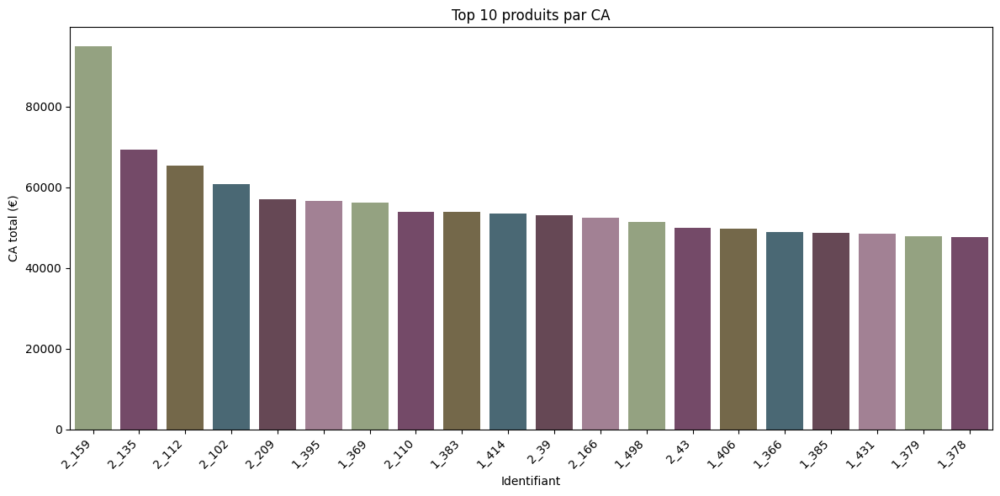

In [ ]:
top_CA = df_merged.groupby('id_prod')['price'].sum().sort_values(ascending=False).head(20).reset_index()
top_CA.columns = ['id_prod', 'total_CA']
top_CA.head()

#Graphique
plt.figure(figsize=(12, 6))

sb.barplot(x='id_prod', y='total_CA', data=top_CA, hue='id_prod', palette=couleurs_theme2, legend=False)
plt.title('Top 10 produits par CA')
plt.xlabel('Identifiant')
plt.ylabel('CA total (€)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
#Flop 10 produits par CA
flop_CA = df_merged.groupby('id_prod')['price'].sum().sort_values(ascending=True).head(20).reset_index()
flop_CA.columns = ['id_prod', 'total_CA'] 
flop_CA.head()


,id_prod,total_CA
0,0_1539,0.99
1,0_1284,1.38
2,0_1653,1.98
3,0_541,1.99
4,0_1601,1.99


In [ ]:
#Nombres de produits avec moins de 10 ventes
nb_produits_flop = (df_merged['id_prod'].value_counts() < 10).sum()
print(f"Il y a {nb_produits_flop} produits avec moins de 10 ventes.")

Il y a 459 produits avec moins de 10 ventes.


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">4.2 - Analyse des références</h3>
</div>

In [ ]:
# Distribution des prix par catégorie

fig_box = px.box(
    df_merged,
    x='categ',
    y='price',
    color='categ', # Colorer par catégorie
    color_discrete_sequence=couleurs_theme2,
    title='Distribution des prix par catégorie de produit',
    labels={'categ': 'Catégorie de produit', 'price': 'Prix (€)'},
    points='outliers' # Afficher les points aberrants
)
fig_box.update_traces(boxmean=True) # Afficher la moyenne
fig_box.update_layout(showlegend=False) # Masquer la légende si la couleur est déjà dans l'axe x
fig_box.show()

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">4.5 - Analyse des clients et transactions</h3>
</div>

In [ ]:
#Nombre de client unique
nb_clients_uniques = df_merged["client_id"].nunique()
print(f"Nombre de clients uniques : {nb_clients_uniques}")

Nombre de clients uniques : 8600


In [ ]:
#Age moyen des client 
df_merged['birth']=pd.to_numeric(df_merged['birth'], errors='coerce')
df_merged['Année']=pd.to_numeric(df_merged['Année'], errors='coerce')
df_merged['age_achat'] =df_merged['Année']-df_merged['birth']

df_merged.head()


,id_prod,date,session_id,client_id,sex,birth,price,categ,Jour,Mois,Année,semaine,Mois_num,date_2,age_achat
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,f,1967,11.99,0,Lundi,Mars,2021,9,3,2021-03-01,54
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,m,1960,19.37,0,Lundi,Mars,2021,9,3,2021-03-01,61
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,m,1988,4.50,0,Lundi,Mars,2021,9,3,2021-03-01,33
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912,f,1989,6.55,0,Lundi,Mars,2021,9,3,2021-03-01,32
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033,f,1956,16.49,0,Lundi,Mars,2021,9,3,2021-03-01,65


In [ ]:
#Distribution des ages des clients
fig = px.box(df_merged['age_achat'].dropna(), y=df_merged['age_achat'].dropna(), points='outliers', title='Distribution des âges des clients', color_discrete_sequence=['darkblue'])
fig.update_layout(yaxis_title='Age des clients (années)')
fig.show()

In [ ]:
clients_par_age = (
    df_merged
    .groupby("age_achat")["client_id"]
    .nunique()
    .reset_index(name="nb_clients")
    .sort_values("age_achat")
)   
clients_par_age.head()

,age_achat,nb_clients
0,17,435
1,18,574
2,19,607
3,20,367
4,21,357


C:\Users\chris\AppData\Local\Temp\ipykernel_6876\20844265.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



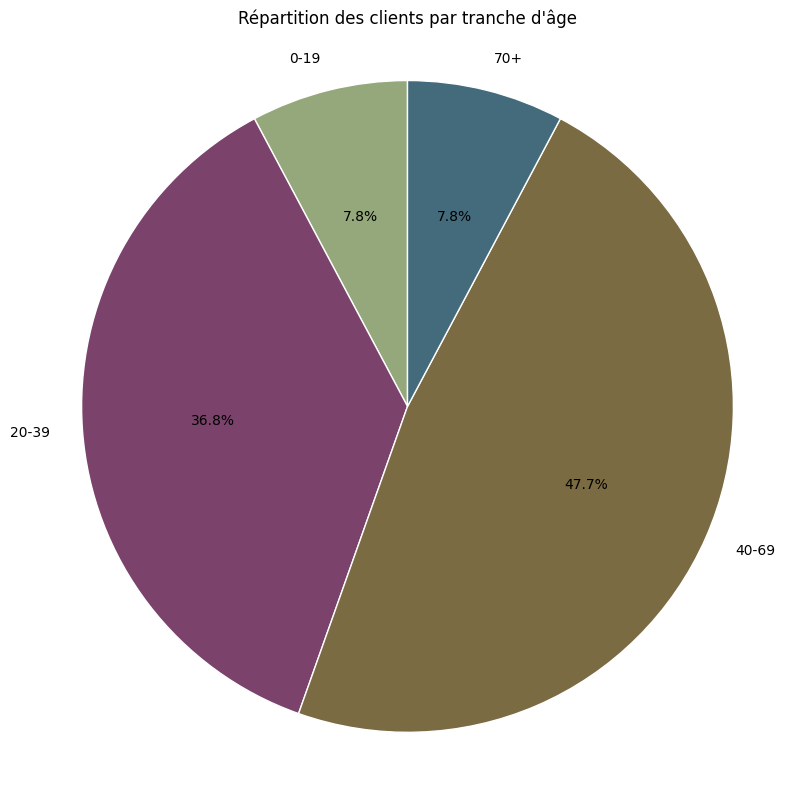

In [ ]:
#Nombre de clients par tranche d'âge
bins = [0, 20, 40, 70, 100]
labels = ['0-19', '20-39', '40-69', '70+']
df_merged['age_tranche'] = pd.cut(df_merged['age_achat'], bins=bins, labels=labels, right=False)
clients_par_tranche = df_merged.groupby('age_tranche')['client_id'].nunique().reset_index(name='nb_clients')
clients_par_tranche.head()

#Graphique du nombre de clients par tranche d'âge (camembert)
plt.figure(figsize=(8, 8))
values = clients_par_tranche['nb_clients']
labels = clients_par_tranche['age_tranche']

plt.pie(
    values,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=couleurs_theme2,
    wedgeprops={'edgecolor': 'white'}
)
plt.title('Répartition des clients par tranche d\'âge')
plt.axis('equal')  # Assure un cercle
plt.tight_layout()
plt.show()

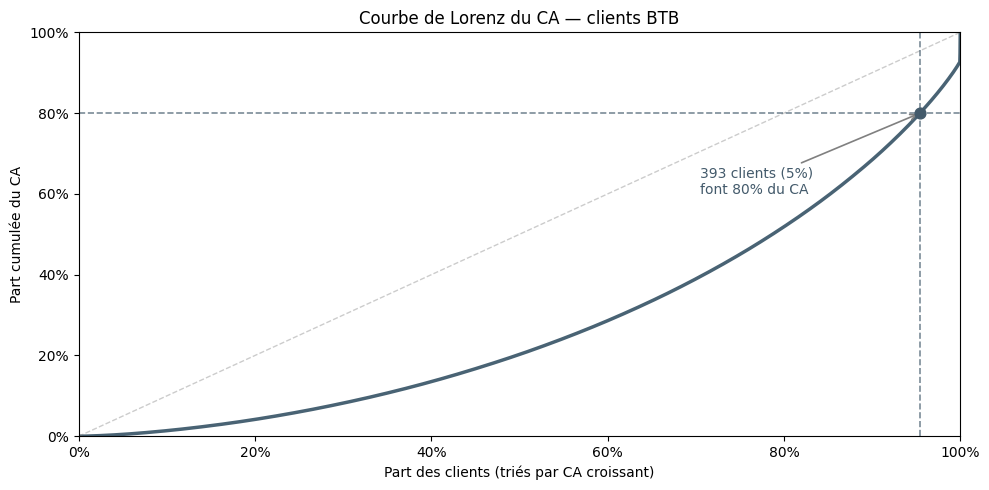

→ 393 clients sur 8600 représentent 80% du CA
→ Soit les 5% de clients avec le CA le plus élevé


In [ ]:
#Courbe de Lorenz du CA par client

ca_client = (
    df_merged.groupby("client_id")["price"]
    .sum()
    .sort_values()
)

vals = ca_client.values
cum_share = np.cumsum(vals) / np.sum(vals)
n = len(ca_client)
x_norm = np.arange(n) / (n - 1)  # axe en % de clients (0 → 1)

# Point 80%
idx_80 = np.searchsorted(cum_share, 0.8)
x_80 = x_norm[idx_80]
nb_clients_80 = n - idx_80  # clients qui font 80% du CA (les plus gros)

fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(x_norm, cum_share, linewidth=2.5, color=couleurs_theme[0])
ax.plot([0, 1], [0, 1], linewidth=1, color="gray", linestyle="--", alpha=0.4)  # égalité parfaite

# Ligne 80%
ax.axhline(0.8, linestyle="--", linewidth=1.2, color=couleurs_theme[3], alpha=0.7)
ax.axvline(x_80, linestyle="--", linewidth=1.2, color=couleurs_theme[3], alpha=0.7)

# Point d'intersection
ax.scatter([x_80], [0.8], color=couleurs_theme[3], zorder=5, s=60)

# Annotation
ax.annotate(
    f"{nb_clients_80} clients ({100 - round(x_80 * 100)}%)\nfont 80% du CA",
    xy=(x_80, 0.8),
    xytext=(x_80 - 0.25, 0.6),
    arrowprops=dict(arrowstyle="->", color="gray", lw=1.2),
    fontsize=10,
    color=couleurs_theme[3],
)

ax.set_title("Courbe de Lorenz du CA — clients BTB")
ax.set_xlabel("Part des clients (triés par CA croissant)")
ax.set_ylabel("Part cumulée du CA")
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{round(v*100)}%"))
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{round(v*100)}%"))
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

print(f"→ {nb_clients_80} clients sur {n} représentent 80% du CA")
print(f"→ Soit les {round(100 - x_80*100)}% de clients avec le CA le plus élevé")

La courbe est tres aplatie et indique une forte inégalité, on a une masse de petits acheteurs.
La courbe quasi verticale represente les plus gros acheteurs qui sont les client BTB.
5% des client représentes 80% du CA ce qui représente une concentration extreme.

In [ ]:
# Calcul de l'âge à partir de birth
annee_ref = 2023
df_btc= df_merged.copy()
df_btc["age"] = annee_ref - df_merged["birth"]

# Agrégation par client (1 ligne = 1 client)
panier = (
    df_btc.groupby(["client_id", "session_id"])["id_prod"]
    .count()
    .reset_index(name="nb_produits")
)
panier_moy = panier.groupby("client_id")["nb_produits"].mean().reset_index(name="panier_moyen")

df_client = (
    df_btc.groupby("client_id").agg(
        sex          = ("sex",        "first"),
        age          = ("age",        "first"),
        ca_total     = ("price",      "sum"),
        nb_sessions  = ("session_id", "nunique"), # nombre de sessions différentes (visites) du client
        categ_mode   = ("categ",      lambda x: x.mode()[0]) # categorie qui a éte vendue le plus souvent au client
    )
    .reset_index()
    .merge(panier_moy, on="client_id")
)

print(df_client.head())

  client_id sex  age  ca_total  nb_sessions  categ_mode  panier_moyen
0       c_1   m   68    629.02           34           0      1.264706
1      c_10   m   67   1353.60           34           1      1.705882
2     c_100   m   31    254.85            5           1      1.600000
3    c_1000   f   57   2291.88           94           1      1.340426
4    c_1001   m   41   1823.85           47           0      2.191489


In [ ]:
# Seuil B2B basé sur le tableau — les 4 vrais B2B ont tous > 2000 sessions
clients_b2b = df_client[df_client["nb_sessions"] >= 2000]["client_id"]

# Deux dataframes BTB et BTC
df_btc = df_client[~df_client["client_id"].isin(clients_b2b)].copy()
df_btb = df_client[ df_client["client_id"].isin(clients_b2b)].copy()

print(f"B2B : {len(df_btb)} clients")
print(f"B2C : {len(df_btc)} clients")
print("\nProfil B2B :")
print(df_btb[["client_id", "ca_total", "nb_sessions"]].to_string(index=False))


B2B : 4 clients
B2C : 8596 clients

Profil B2B :
client_id  ca_total  nb_sessions
   c_1609 326039.89        10997
   c_3454 114110.57         5571
   c_4958 290227.03         3851
   c_6714 153918.60         2620


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(147, 197, 114); ">4.6 - Corrélations</h3>
</div>

#### 1.Conditions pour utiliser Pearson (paramétrique)─
1. Normalité
Chaque variable doit suivre une loi normale. Vérifié par Shapiro-Wilk (p > 0.05) et Q-Q plot aligné sur la droite.
2. Linéarité
La relation entre les deux variables doit être linéaire. Vérifiable visuellement avec un scatter plot.
3. Homoscédasticité
La variance des résidus doit être constante le long de la droite de régression.
4. Pas d'outliers extrêmes
Pearson est très sensible aux valeurs aberrantes — un seul outlier peut faire basculer le rho.

#### 2. Conditions pour utiliser Spearman (non-paramétrique)─
1. Relation monotone
Quand X augmente, Y tend à augmenter (ou diminuer) — pas forcément de façon linéaire.
2. Variables ordinales ou continues
Fonctionne sur des rangs — pas besoin de normalité, robuste aux outliers.
3. Aucune condition de distribution
C'est précisément pourquoi on l'a choisi pour CA, fréquence et panier moyen.

In [ ]:
from scipy import stats
from scipy.stats import chi2_contingency, spearmanr, kruskal, mannwhitneyu
from itertools import combinations

Variable              Shapiro p-val  Normale ?
CA total                     0.0000        NON
Nb sessions                  0.0000        NON
Panier moyen                 0.0000        NON


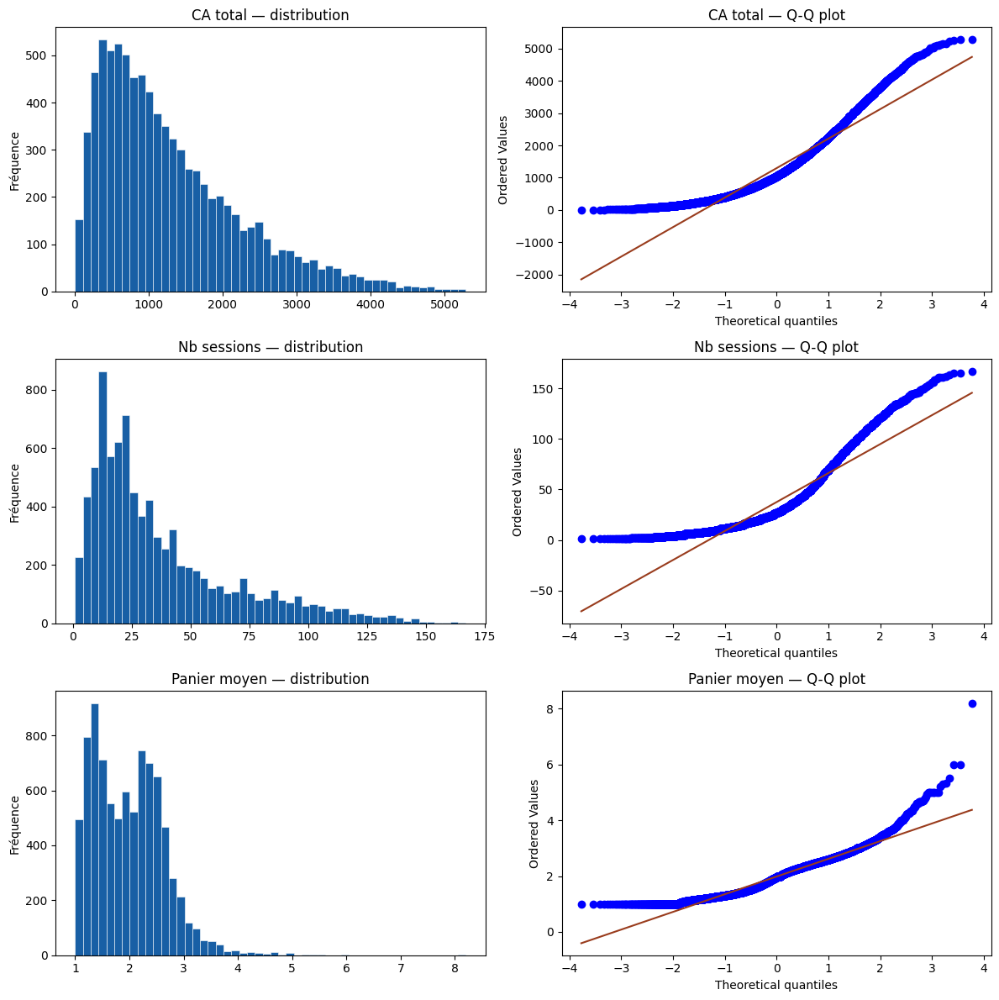


Variable               Skewness   Kurtosis
------------------------------------------
CA total                   1.16       1.09
Nb sessions                1.36       1.33
Panier moyen               0.86       2.08
(Normale si skewness ≈ 0 et kurtosis ≈ 0)


In [ ]:

# ── 1. Test de normalité ───────────────────────────────────────────────────────
# Shapiro-Wilk fiable seulement sur n < 5000 → on échantillonne si besoin
print("=" * 55)
print(f"{'Variable':<20} {'Shapiro p-val':>14} {'Normale ?':>10}")
print("=" * 55)

variables = {
    "CA total"       : df_btc["ca_total"],
    "Nb sessions"    : df_btc["nb_sessions"],
    "Panier moyen"   : df_btc["panier_moyen"]
} 

for nom, serie in variables.items():
    sample = serie.dropna()
    if len(sample) > 5000:
        sample = sample.sample(5000, random_state=42)
    stat, p = stats.shapiro(sample)
    normale = "OUI" if p > 0.05 else "NON"
    print(f"{nom:<20} {p:>14.4f} {normale:>10}")

print("=" * 55)

# ── 3. Visualisation — histogramme + Q-Q plot pour chaque variable ────────────
fig, axes = plt.subplots(len(variables), 2, figsize=(12, 4 * len(variables)))

for i, (nom, serie) in enumerate(variables.items()):
    data = serie.dropna()

    # Histogramme
    axes[i, 0].hist(data, bins=50, color="#185FA5", edgecolor="white", linewidth=0.4)
    axes[i, 0].set_title(f"{nom} — distribution")
    axes[i, 0].set_ylabel("Fréquence")

    # Q-Q plot — si points alignés sur la droite = normale
    stats.probplot(data, dist="norm", plot=axes[i, 1])
    axes[i, 1].set_title(f"{nom} — Q-Q plot")
    axes[i, 1].get_lines()[1].set_color("#993C1D")  # droite théorique en rouge

plt.tight_layout()
plt.show()

# ── 4. Asymétrie et aplatissement ─────────────────────────────────────────────
print(f"\n{'Variable':<20} {'Skewness':>10} {'Kurtosis':>10}")
print("-" * 42)
for nom, serie in variables.items():
    sk = serie.skew()
    ku = serie.kurtosis()
    print(f"{nom:<20} {sk:>10.2f} {ku:>10.2f}")
print("(Normale si skewness ≈ 0 et kurtosis ≈ 0)")

Catégorie         N    Shapiro p   Skewness   Kurtosis  Normale ?
Catég. 0        4626       0.0000       0.78       1.08        NON
Catég. 1        2993       0.0000      -0.34      -1.10        NON
Catég. 2         977       0.0000       1.04       8.68        NON


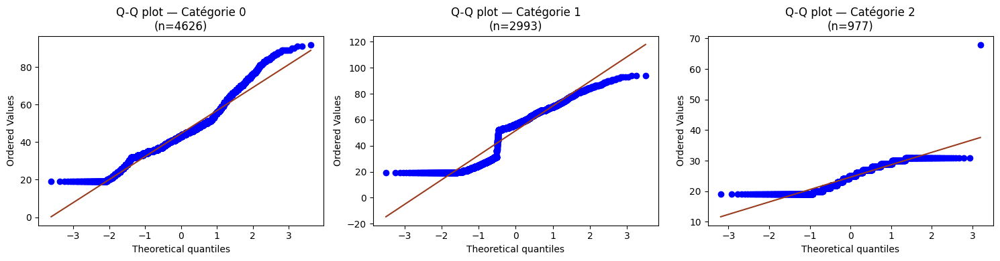

In [ ]:
# ── Test de normalité de l'âge par catégorie (sur df_btc) ────────────────────

print("=" * 60)
print(f"{'Catégorie':<12} {'N':>6} {'Shapiro p':>12} {'Skewness':>10} {'Kurtosis':>10} {'Normale ?':>10}")
print("=" * 60)

for cat in sorted(df_btc["categ_mode"].unique()):
    ages = df_btc[df_btc["categ_mode"] == cat]["age"].dropna()
    
    # Shapiro (échantillon si n > 5000)
    sample = ages.sample(min(5000, len(ages)), random_state=42)
    stat, p = stats.shapiro(sample)
    
    sk = ages.skew()
    ku = ages.kurtosis()
    normale = "OUI" if p > 0.05 else "NON"
    
    print(f"Catég. {cat:<6} {len(ages):>6} {p:>12.4f} {sk:>10.2f} {ku:>10.2f} {normale:>10}")

print("=" * 60)

# ── Visualisation Q-Q plot par catégorie ─────────────────────────────────────
categories = sorted(df_btc["categ_mode"].unique())
fig, axes = plt.subplots(1, len(categories), figsize=(5 * len(categories), 4))

for i, cat in enumerate(categories):
    ages = df_btc[df_btc["categ_mode"] == cat]["age"].dropna()
    stats.probplot(ages, dist="norm", plot=axes[i])
    axes[i].set_title(f"Q-Q plot — Catégorie {cat}\n(n={len(ages)})")
    axes[i].get_lines()[1].set_color("#993C1D")

plt.tight_layout()
plt.show()

In [ ]:
# ── 1. Genre × Catégorie  →  Chi² + V de Cramér (Variables nominales)──────────────────────────────

contingency = pd.crosstab(df_btc["sex"], df_btc["categ_mode"])
chi2, p, dof, expected = chi2_contingency(contingency)

n = contingency.values.sum()
k = min(contingency.shape) - 1
v_cramer = np.sqrt(chi2 / (n * k))

print("=== 1. Genre × Catégorie ===")
print(f"Chi² = {chi2:.3f}, p = {p:.4f}, ddl = {dof}")
print(f"V de Cramér = {v_cramer:.3f}  (0=aucune, 1=parfaite)")
print(contingency, "\n")

# ── 2. Âge × Montant total  →  Spearman (Variables continues, test non paramétriques)──────────────────────────────────────

rho, p = spearmanr(df_btc["age"], df_btc["ca_total"])
print("=== 2. Âge × Montant total ===")
print(f"Spearman rho = {rho:.3f}, p = {p:.4f}\n")

# ── 3. Âge × Fréquence d'achat  →  Spearman (Variables continues, test non paramétriques)─────────────────────────────────

rho, p = spearmanr(df_btc["age"], df_btc["nb_sessions"])
print("=== 3. Âge × Fréquence d'achat ===")
print(f"Spearman rho = {rho:.3f}, p = {p:.4f}\n")

# ── 4. Âge × Panier moyen  →  Spearman (Variables continues, test non paramétriques)───────────────────────────────────────

rho, p = spearmanr(df_btc["age"], df_btc["panier_moyen"])
print("=== 4. Âge × Panier moyen ===")
print(f"Spearman rho = {rho:.3f}, p = {p:.4f}\n")

# ── 5. Âge × Catégorie  →  Kruskal-Wallis + post-hoc Mann-Whitney ────────────

categories = df_btc["categ_mode"].unique()
groupes = [df_btc.loc[df_btc["categ_mode"] == c, "age"].values for c in categories]

stat, p = kruskal(*groupes)
print("=== 5. Âge × Catégorie ===")
print(f"Kruskal-Wallis H = {stat:.3f}, p = {p:.4f}")

if p < 0.05:
    print("→ Différences significatives, post-hoc Mann-Whitney (Bonferroni) :")
    paires = list(combinations(range(len(categories)), 2))
    alpha_corr = 0.05 / len(paires)
    for i, j in paires:
        u, p_mw = mannwhitneyu(groupes[i], groupes[j], alternative="two-sided")
        sig = "✓" if p_mw < alpha_corr else "✗"
        print(f"  {categories[i]} vs {categories[j]} : p={p_mw:.4f} {sig}")


=== 1. Genre × Catégorie ===
Chi² = 4.898, p = 0.0864, ddl = 2
V de Cramér = 0.024  (0=aucune, 1=parfaite)
categ_mode     0     1    2
sex                        
f           2370  1608  500
m           2256  1385  477 

=== 2. Âge × Montant total ===
Spearman rho = -0.185, p = 0.0000

=== 3. Âge × Fréquence d'achat ===
Spearman rho = 0.212, p = 0.0000

=== 4. Âge × Panier moyen ===
Spearman rho = -0.208, p = 0.0000

=== 5. Âge × Catégorie ===
Kruskal-Wallis H = 2003.668, p = 0.0000
→ Différences significatives, post-hoc Mann-Whitney (Bonferroni) :
  0 vs 1 : p=0.0000 ✓
  0 vs 2 : p=0.0000 ✓
  1 vs 2 : p=0.0000 ✓



#### 1. Conditions─

##### 🧬 Niveau 1 — p-value : La corrélation existe-t-elle ?

| Résultat | Interprétation |
| :--- | :--- |
| **p < 0.05** | **Significatif** — La corrélation n'est pas due au hasard. |
| **p ≥ 0.05** | **Non significatif** — On ne peut pas affirmer de corrélation. |

> **Attention :** Sur un grand échantillon (n > 1000), presque tout devient significatif. La p-value indique si la corrélation **existe**, pas si elle est **utile**.

##### 📊 Niveau 2 — rho de Spearman : Quelle est la force ?

| Valeur de rho | Force de la corrélation |
| :--- | :--- |
| **0.5 à 1.0** | **Forte** — Une variable explique très bien l'autre. |
| **0.3 à 0.5** | **Modérée** — Signal réel mais partiel. |
| **0.1 à 0.3** | **Faible** — Signal présent mais effet limité. |
| **0.0 à 0.1** | **Négligeable** — Aucun intérêt pratique. |

*Note : Les valeurs négatives s'interprètent de la même façon. Le signe indique le sens.*


##### 📉 Pour le Chi² — V de Cramér : Force de l'association

| V de Cramér | Intensité de l'association |
| :--- | :--- |
| **> 0.3** | Association **forte**. |
| **0.1 à 0.3** | Association **modérée**. |
| **< 0.1** | Association **négligeable**. |


#### 2. 📊 Synthèse des Corrélations

| Variable 1 × Variable 2 | p-value | Coefficient ($\rho$ / V / H) | Verdict |
| :--- | :--- | :--- | :--- |
| **Genre × Catégorie** | 0.086 | $V = 0.024$ | ⚪ Non significatif + négligeable |
| **Âge × CA total** | 0.000 | $\rho = -0.185$ | 🟡 Significatif mais faible |
| **Âge × Fréquence** | 0.000 | $\rho = +0.212$ | 🟡 Significatif mais faible |
| **Âge × Panier moyen** | 0.000 | $\rho = -0.208$ | 🟡 Significatif mais faible |
| **Âge × Catégorie** | 0.000 | $H = 2003$ | 🟢 **Significatif et fort** |

> **Note :** Le test de Kruskal-Wallis ($H$) pour Âge × Catégorie montre une influence majeure de la tranche d'âge sur les habitudes d'achat.

#### Conclusions

Corrélation         |Résultat                   |Interprétation
| :--- | :--- | :--- 
Genre × Catégorie   |Non significatif (p=0.086) |Le genre ne prédit pas la catégorie
Âge × CA total      |rho = -0.185               |Les clients plus âgés dépensent légèrement moins
Âge × Fréquence     |rho = +0.212               |Les clients plus âgés achètent plus souvent
Âge × Panier moyen  |rho = -0.208               |Les clients plus âgés ont un plus petit panier
Âge × Catégorie     |H = 2003, toutes paires ✓  |L'âge structure fortement la catégorie achetée

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Préparer les données — label lisible pour la catégorie
df_box = df_btc[["age", "categ_mode"]].copy()
df_box["categ_label"] = df_box["categ_mode"].map({
    0: "Catégorie 0",
    1: "Catégorie 1",
    2: "Catégorie 2"
})

# Calcul des médianes pour annotation
medianes = df_box.groupby("categ_label")["age"].median().round(1)

fig = px.box(
    df_box,
    x="categ_label",
    y="age",
    color="categ_label",
    color_discrete_sequence=["#185FA5", "#0F6E56", "#993C1D"],
    points=False,  # pas de points individuels (trop de données)
    labels={"age": "Âge", "categ_label": "Catégorie"},
    title="Distribution de l'âge par catégorie achetée<br><sup>Kruskal-Wallis H=2003, p&lt;0.0001 — toutes les paires significatives</sup>",
)

# Annotation des médianes sur chaque boîte
for i, (cat, med) in enumerate(medianes.items()):
    fig.add_annotation(
        x=cat,
        y=med,
        text=f"Médiane : {med} ans",
        showarrow=False,
        yshift=12,
        font=dict(size=11, color="white"),
        bgcolor="rgba(0,0,0,0.35)",
        borderpad=3,
    )

fig.update_layout(
    showlegend=False,
    yaxis_title="Âge",
    xaxis_title="",
    plot_bgcolor="white",
    yaxis=dict(gridcolor="#eeeeee"),
)

fig.show()